# Homework 3: Augmented Reality with Planar Homographies

#### **For each question please refer to the handout for more details.**

Programming questions begin at **Q2**. **Remember to run all cells** and save the notebook to your local machine as a pdf for gradescope submission.

# Collaborators
**List your collaborators for all questions here**:


---

# Q1 Preliminaries

## Q1.1 The Direct Linear Transform


### Q1.1.1 (3 points)

How many degrees of freedom does **h** have?

---

**h** has 8 degrees of freedom.

We know that **h** matrix is defined as:
\[
H =
\begin{bmatrix}
a & b & c \\
d & e & f \\
g & h & i
\end{bmatrix}
\]

**h** matrix has 9 entries however one is used for scale. If we fix **h**(3,3) = 1, we get 9 - 1 = 8 independent factors.

---

### Q1.1.2 (2 points)

How many point pairs are required to solve **h**?

---

We need at least 4 correspondences to solve for **h**. Each point pair will give us 2 independent linear equations. To solve for 8 DOF, we need at least 4 point pairs.

---

### Q1.1.3 (5 points)

Derive $\textbf{A}_i$

---

We know that,  
$
H =
\begin{bmatrix}
a & b & c \\
d & e & f \\
g & h & i
\end{bmatrix}
$  

Given:  
$x_1$ in an image and $x_2$ as the set of corresponding points in an image taken by another camera.

Given equation 1:
$$\mathbf{x}_1^{i} \equiv \mathbf{H} \mathbf{x}_2^{i} \quad (i \in \{1 \ldots N\})$$

We can write this as:
$$
\begin{bmatrix}
x_1^{i} \\ y_1^{i} \\ 1
\end{bmatrix}
\equiv
\begin{bmatrix}
a & b & c \\
d & e & f \\
g & h & i
\end{bmatrix}
\begin{bmatrix}
x_2^{i} \\
y_2^{i} \\
1
\end{bmatrix}
\quad (i \in \{1 \ldots N\})
$$

For a particular i, we get:
$$
\begin{bmatrix}
x_1 \\ y_1 \\ 1
\end{bmatrix}
\equiv
\begin{bmatrix}
ax_2 + by_2 + c \\
dx_2 + ey_2 + f \\
gx_2 + hy_2 + 1
\end{bmatrix}
$$


For each term we can write it as:
$$
x_1 = \frac{a x_2 + b y_2 + c}{g x_2 + h y_2 + 1}
$$

$$
y_1 = \frac{d x_2 + e y_2 + f}{g x_2 + h y_2 + 1}
$$

Cross multiplying, we get:
$$
x_1 * (g x_2 + h y_2 + 1) = a x_2 + b y_2 + c
$$

$$
y_1 * (g x_2 + h y_2 + 1)= d x_2 + e y_2 + f
$$

We want to represent this in the form of
$$ A_i h = 0 $$

Rearranging terms we get:
$$
g x_1 x_2 + h x_1 y_2 + x_1 - a x_2 - b y_2 - c = 0
$$

$$
g y_1 x_2 + h y_1 y_2 + y_1 - d x_2 - e y_2 - f = 0
$$

Rewriting above equations we get:
$\small
\begin{bmatrix}
-x_2 & -y_2 & -1 & 0 & 0 & 0 & x_1 x_2 & x_1 y_2 & x_1 \\
0 & 0 & 0 & -x_2 & -y_2 & -1 & y_1 x_2 & y_1 y_2 & y_1
\end{bmatrix}
\begin{bmatrix}
 a \\ b \\ c \\ d \\ e \\ f \\ g \\ h \\ i = 1
\end{bmatrix}
= 0$

Thus $A_i$ is:
$
\begin{bmatrix}
-x_2 & -y_2 & -1 & 0 & 0 & 0 & x_1 x_2 & x_1 y_2 & x_1 \\
0 & 0 & 0 & -x_2 & -y_2 & -1 & y_1 x_2 & y_1 y_2 & y_1
\end{bmatrix}
$
---

### Q1.1.4 (5 points)

What will be the trivial solution for **h**? Is the matrix **A** full rank? Why/Why not? What impact will it have on the singular values (i.e. eigenvalues of $\textbf{A}^T\textbf{A}$)?

---

The trivial solution is when when **h** is 0 as
$ A h = 0 $
$ A 0 = 0$

**A** is not full rank.

This is because **h** is only defined upto scale.

This means that one of the eigen values of A has to be 0. Thus one eigen value will be 0. The smallest singular value is close to 0 and its right singular vector gives the homography.


---

## Q1.2 Homography Theory Questions

### Q1.2.1 (5 points)

Prove that there exists a homography **H** that satisfies $\textbf{x}_1 ≡ \textbf{Hx}_2$, given two cameras separated by a pure rotation.

---

Given two cameras related by a pure rotation:

$$
\mathbf{x}_1 = K_1 [I \mid 0] \mathbf{X},
\quad
\mathbf{x}_2 = K_2 [R \mid 0] \mathbf{X}
$$

Substituting $\mathbf{X}$ in terms of $\mathbf{x}_2$ and ignoring the 0 column (since there’s no translation):

$$
\mathbf{x}_1 = K_1 I R^{-1} K_2^{-1} \mathbf{x}_2
$$

$$
\mathbf{x}_1 = K_1 R^{-1} K_2^{-1} \mathbf{x}_2
$$

We know that a rotation matrix is a special type of orthogonal matrix, where the inverse is equal to its transpose.  
Hence,

$$
H = K_1 R^T K_2^{-1}
$$


---

### Q1.2.2 (5 points):

Show that $\textbf{H}^2$ is the homography corresponding to a rotation of 2$\theta$.

---
From the previous question, we showed that the homography with pure rotation looks like

$$
H = K_1 R^T K_2^{-1}
$$

Since in this part the camera is the same, $K_1 = K_2 = K$. Hence, the equation becomes:

$$
H = K R^T K^{-1}
$$

We can represent $R^T$ as another rotation matrix $R$, and then rotating by an angle $\theta$ gives:

$$
H = K R(\theta) K^{-1}
$$

Computing $H^2$:

$$
H^2 = H \cdot H = K R(\theta) K^{-1} K R(\theta) K^{-1} = K R(\theta) R(\theta) K^{-1}
$$

We know that 2D or 3D rotations $R$ belong to the special orthogonal group, where the multiplication of two rotations adds their angles.

$$
H^2 = K R(2\theta) K^{-1}
$$

Hence proved.

---

# Initialization

Run the following code to import the modules you'll need.

In [30]:
import os
import numpy as np
import cv2
import skimage.color
import pickle
from matplotlib import pyplot as plt
import scipy
from skimage.util import montage
import time

PATCHWIDTH = 9

def read_pickle(path):
    with open(path, "rb") as f:
        return pickle.load(f)

def write_pickle(path, data):
    with open(path, "wb") as f:
        pickle.dump(data, f)

def briefMatch(desc1,desc2,ratio):

    matches = skimage.feature.match_descriptors(desc1,desc2,
                                                'hamming',
                                                cross_check=True,
                                                max_ratio=ratio)
    return matches

def plotMatches(img1,img2,matches,locs1,locs2, path = 'img.png'):

    fig, ax = plt.subplots(nrows=1, ncols=1)
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    plt.axis('off')
    skimage.feature.plot_matched_features(img1,img2,
                                          keypoints0=locs1,keypoints1=locs2,
                                          matches=matches,ax=ax,
                                          matches_color='r',only_matches=True)
    plt.savefig(path, bbox_inches="tight")
    plt.show()
    return

def makeTestPattern(patchWidth, nbits):

    np.random.seed(0)
    compareX = patchWidth*patchWidth * np.random.random((nbits,1))
    compareX = np.floor(compareX).astype(int)
    np.random.seed(1)
    compareY = patchWidth*patchWidth * np.random.random((nbits,1))
    compareY = np.floor(compareY).astype(int)

    return (compareX, compareY)

def computePixel(img, idx1, idx2, width, center):

    halfWidth = width // 2
    col1 = idx1 % width - halfWidth
    row1 = idx1 // width - halfWidth
    col2 = idx2 % width - halfWidth
    row2 = idx2 // width - halfWidth
    return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0

def computeBrief(img, locs):

    patchWidth = 9
    nbits = 256
    compareX, compareY = makeTestPattern(patchWidth,nbits)
    m, n = img.shape

    halfWidth = patchWidth//2

    locs = np.array(list(filter(lambda x: halfWidth <= x[0] < m-halfWidth and halfWidth <= x[1] < n-halfWidth, locs)))
    desc = np.array([list(map(lambda x: computePixel(img, x[0], x[1], patchWidth, c), zip(compareX, compareY))) for c in locs])

    return desc, locs

def corner_detection(img, sigma):

    # fast method
    result_img = skimage.feature.corner_fast(img, n=PATCHWIDTH, threshold=sigma)
    locs = skimage.feature.corner_peaks(result_img, min_distance=1)
    return locs

def loadVid(path):

    # Create a VideoCapture object and read from input file
    # If the input is the camera, pass 0 instead of the video file name

    cap = cv2.VideoCapture(path)

    # get fps, width, and height
    fps = cap.get(cv2.CAP_PROP_FPS)
    width  = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
    height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)

    # Append frames to list
    frames = []

    # Check if camera opened successfully
    if cap.isOpened()== False:
        print("Error opening video stream or file")

    # Read until video is completed
    while(cap.isOpened()):

        # Capture frame-by-frame
        ret, frame = cap.read()

        if ret:
            #Store the resulting frame
            frames.append(frame)
        else:
            break

    # When everything done, release the video capture object
    cap.release()
    frames = np.stack(frames)

    return frames, fps, width, height

# Download data

Download the required data and setup the results directory. If running on colab, DATA_PARENT_DIR must be <br> DATA_PARENT_DIR = '/content/' <br> <br> Otherwise, use the local directory of your choosing. Data will be downloaded to DATA_PARENT_DIR/hw3_data and a subdirectory DATA_PARENT_DIR/results will be created.

In [31]:
# Only change this if you are running locally
# Default on colab: DATA_PARENT_DIR = '/content/'

# Data will be downloaded to DATA_PARENT_DIR/hw3_data
# A subdirectory DATA_PARENT_DIR/results will be created

DATA_PARENT_DIR = '/content/'

if not os.path.exists(DATA_PARENT_DIR):
  raise RuntimeError('DATA_PARENT_DIR does not exist: ', DATA_PARENT_DIR)

RES_DIR = os.path.join(DATA_PARENT_DIR, 'results')
if not os.path.exists(RES_DIR):
  os.mkdir(RES_DIR)
  print('made directory: ', RES_DIR)


#paths different files are saved to
# OPTIONAL:
# feel free to change if funning locally
ROT_MATCHES_PATH = os.path.join(RES_DIR, 'brief_rot_test.pkl')
ROT_INV_MATCHES_PATH = os.path.join(RES_DIR, 'ec_brief_rot_inv_test.pkl')
AR_VID_FRAMES_PATH = os.path.join(RES_DIR, 'q_3_1_frames.npy')
AR_VID_FRAMES_EC_PATH = os.path.join(RES_DIR, 'q_3_2_frames.npy')

HW3_SUBDIR = 'hw3_data'
DATA_DIR = os.path.join(DATA_PARENT_DIR, HW3_SUBDIR)
ZIP_PATH = DATA_DIR + '.zip'
if not os.path.exists(DATA_DIR):
  !wget 'https://www.andrew.cmu.edu/user/hfreeman/data/16720_spring/hw3_data.zip' -O $ZIP_PATH
  !unzip -qq $ZIP_PATH -d $DATA_PARENT_DIR

# Q2 Computing Planar Homographies

## Q2.1 Feature Detection and Matching

### Q2.1.1 (5 points):

How is the FAST detector different from the Harris corner detector that you've seen in the lectures? Can you comment on its computation performance compared to the Harris corner detector?

---

Harris corner detector first computes x and y derivative of the image. Then computes sum of products of derivatives at each pixel to get a matrix.
\begin{equation}
M(x, y) =
\begin{bmatrix}
S_{x^2}(x, y) & S_{xy}(x, y) \\
S_{xy}(x, y) & S_{y^2}(x, y)
\end{bmatrix}
\end{equation}
It then scores the pixel based on the measurement:
\begin{equation}
R = \det(M) - k(\operatorname{trace} M)^2
\end{equation}
If $R$ is above a certain threshold it is considered a corner as per Harris Corner detector algorithm.

FAST (Features from Accelerated Segment Test) uses a circle of 16 pixels around the target pixel and compares the intensities to find feature points. A corner exists if there are N contiguous pixels all brighter or all darker than the center by a threshold t. It uses a learned decision tree to minimize comparison and Non-maximal Suppression to reduce multiple interest points in adjacent locations.

FAST Detectors are meant to be computationally faster compared to the Harris corner detector. This is because they want to be used for real world application like SLAM. Harris corner detector although much stable computes gradient, matrix M and then R making it computationally expensive than FAST detectors. FAST Detectors are much faster due to just integer calculation and integer comparison but may not be as robust as Harris corner detector. FAST Detector is fast as it removes a lot of non corners by just comparing nearby 16 pixels using only the four pixels first. Hence, it is able to reject a  large chunk of non corners (pretty much most of the image as most of the image are not interest points but only few pixels are interest points - generally speaking). It then applies a full test to all the pixels in the circle for the passed candidates.

---

### Q2.1.2 (5 points):

How is the BRIEF descriptor different from the filterbanks you've seen in the lectures? Could you use any one of the those filter banks as a descriptor?

---

(BRIEF) Binary Robust Independent Elementary Features Descriptors. SIFT is memory intensive in terms of storing the descriptors. BRIEF is used to compress SIFT descriptors to find binary strings without actually finding the descriptors. It takes a smooth images patch and selects location pairs.
For each pair (p, q) it compares the intensities $I(p)$ and $I(q)$. If  $I(p) < I(q)$ then the result is 1 else a 0. BRIEF saves the results as a binary string.
BRIEF is a feature descriptor and not a feature detector. It is applied after keypoint detector

 Filter banks are matrix which when convolved with the original image highlight features like edges or corners which could be at different scales and orientations. We looked at DoG and Gabor filter banks in the lectures.
 For DoG, you first build a Gaussian pyramid with blurred images with different scale and then take the different of these blurred images.  They produce a higher dimensional response vector but are robust to scale.

We can use filter banks as descriptor although they might be computationally heavier. When applying a filter bank to an image we get a set of filter responses at each pixel or patch. Each filter emphasizes a different property like orientation, scale, or frequency. For the filter bank to act as a descriptor, we can store the collection of responses that describes the local texture or structure.
While BRIEF focuses on being fast and compact Filter banks would computationally expensive and memory intensive as it involves gradients and convolution. However, filter banks can be designed to be rotation and scale invariant whereas BRIEF is not rotation invariant.


---

### Q2.1.3 (5 points):

Describe how the Hamming distance and Nearest Neighbor can be used to match interest points with BRIEF descriptors. What benefits does the Hamming distance have over a more conventional Euclidean distance measure in our setting?

---

The BRIEF descriptor encodes each interest region as a binary string by doing fixed intensity comparison tests between pairs of pixels in the patch. For feature matching between two images, we find the closest patch. Hamming distance is used for BRIEF descriptor, which simply counts how many bit positions differ between the two binary strings. Hamming distance is applying XOR and a bitcount which is fast as compared to Euclidean distance.
For each descriptor in image A you compute its Hamming distance to all descriptors in image B, and pick the one with the minimum distance as the correspondence.
For each descriptor from the first image, Nearest neighbor searches through all descriptors in the second image and identifies the one with the smallest (or nearest) distance according to a chosen metric. For BRIEF our chosen metric is Hamming distance for each pair of interest points.

Hamming distance is useful over Euclidean distance as hamming distance reduces computation significantly making them faster. It is also memory efficient, as the descriptors are already in binary format. For binary strings, Euclidean distance doesn't make sense as it uses floating values.

---

### Q2.1.4 (10 points):

#### Implement the function matchPics()

In [32]:
def matchPics(I1, I2, ratio, sigma):
    """
    Match features across images

    Input
    -----
    I1, I2: Source images (RGB or Grayscale uint8)
    ratio: ratio for BRIEF feature descriptor
    sigma: threshold for corner detection using FAST feature detector

    Returns
    -------
    matches: List of indices of matched features across I1, I2 [p x 2]
    locs1, locs2: Pixel coordinates of matches [N x 2]
    """

    # ===== your code here! =====

    # TODO: Convert images to GrayScale
    # Input images can be either RGB or Grayscale uint8 (0 -> 255). Both need
    # to be supported.
    # Input images must be converted to normalized Grayscale (0.0 -> 1.0)
    # skimage.color.rgb2gray may be useful if the input is RGB.
    if I1.ndim == 3:
        I1 = skimage.color.rgb2gray(I1)
    if I2.ndim == 3:
        I2 = skimage.color.rgb2gray(I2)

    # TODO: Detect features in both images
    locs1 = corner_detection(I1, sigma)
    locs2 = corner_detection(I2, sigma)

    # TODO: Obtain descriptors for the computed feature locations
    desc1, locs1 = computeBrief(I1, locs1)
    desc2, locs2 = computeBrief(I2, locs2)

    # TODO: Match features using the descriptors
    matches = briefMatch(desc1, desc2, ratio)

    # ==== end of code ====

    return matches, locs1, locs2

#### Implement the function displayMatched

In [33]:
def displayMatched(I1, I2, ratio, sigma, path):
    """
    Displays matches between two images

    Input
    -----
    I1, I2: Source images
    ratio: ratio for BRIEF feature descriptor
    sigma: threshold for corner detection using FAST feature detector
    """

    print('Displaying matches for ratio: ', ratio, ' and sigma: ', sigma)

    # ===== your code here! =====
    # TODO: Use matchPics and plotMatches to visualize your results
    matches, locs1, locs2 = matchPics(I1, I2, ratio, sigma)
    plotMatches(I1, I2, matches, locs1, locs2, path)

    # ==== end of code ====


#### Visualize the matches

Use the cell below to visualize the matches. The resulting figure should look similar (but not necessarily identical) to Figure 2.

Feel free to play around with the images and parameters. Please use the original images when submitting the report.

Figure 2 parameters:

*   image1_name = "cv_cover.jpg"
*   image1_name = "cv_desk.png"
*   ratio = 0.7
*   sigma = 0.15

Displaying matches for ratio:  0.7  and sigma:  0.15


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


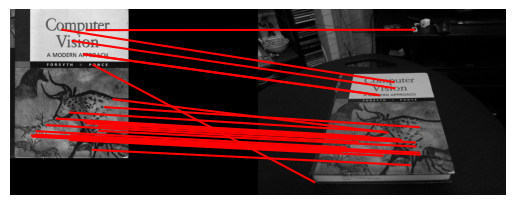

In [21]:
# Feel free to play around with these parameters
# BUT when submitting the report use the original images
image1_name = "cv_cover.jpg"
image2_name = "cv_desk.png"
ratio = 0.7
sigma = 0.15

image1_path = os.path.join(DATA_DIR, image1_name)
image2_path = os.path.join(DATA_DIR, image2_name)

image1 = cv2.imread(image1_path)
image2 = cv2.imread(image2_path)

#bgr to rgb
if len(image1.shape) == 3 and image1.shape[2] == 3:
  image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

if len(image2.shape) == 3 and image2.shape[2] == 3:
  image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

displayMatched(image1, image2, ratio, sigma, path = "2_1_4.png")

### Q2.1.5 (10 points):

Experiment with different sigma and ratio values. Conduct a small ablation study, and include the figures displaying the matched features with various parameters in your write-up. Explain the effect of these two paremeters respectively.

---

Explain the effect of these two parameters:    

Ablation study conducted for values of ratios = {0.6, 0.7, 0.8} and sigmas = {0.05, 0.1, 0.15}.

From the experiments, we see that lower sigma leads dense but noisy matches whereas higher sigma leads to sparse but cleaner matches. Increasing sigma reduced the number of detected corners but improved their reliability meaning that the matches are "good". Sigma is threshold for corner detection using FAST feature detector. Low sigma makes the detector becomes highly sensitive, detecting many points, including weak and unstable corners. This leads to a dense set of matches but introduces significant noise and false correspondences, especially in textured or shadowed regions

Ratio is the ratio for the BRIEF feature descriptor. Low ratio leads to strict matching with only unambiguous matches are accepted. This gives very accurate correspondences, many genuine matches are discarded, leading to sparse alignments. High ratio leads to a lenient threshold that accepts weaker or ambiguous matches, increasing the number of correspondences but also raising the likelihood of false matches and geometric outliers.

From the experiments, we see that a moderate sigma and ratio gives the best balance of reliable and well-distributed correspondences for an accurate homography estimation.

---

Displaying matches for ratio:  0.6  and sigma:  0.05


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


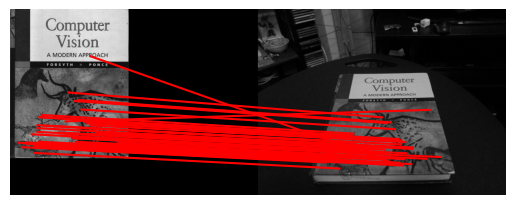

Displaying matches for ratio:  0.6  and sigma:  0.1


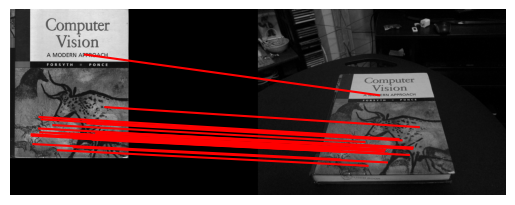

Displaying matches for ratio:  0.6  and sigma:  0.15


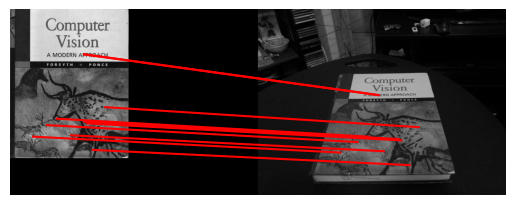

Displaying matches for ratio:  0.7  and sigma:  0.05


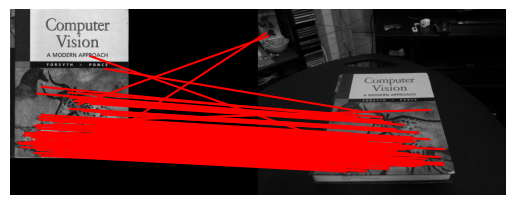

Displaying matches for ratio:  0.7  and sigma:  0.1


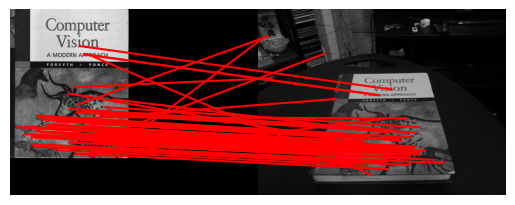

Displaying matches for ratio:  0.7  and sigma:  0.15


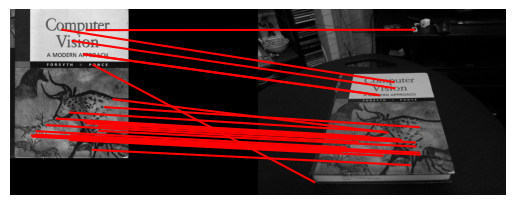

Displaying matches for ratio:  0.8  and sigma:  0.05


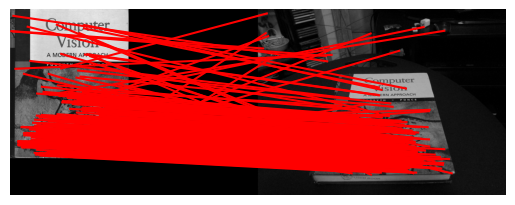

Displaying matches for ratio:  0.8  and sigma:  0.1


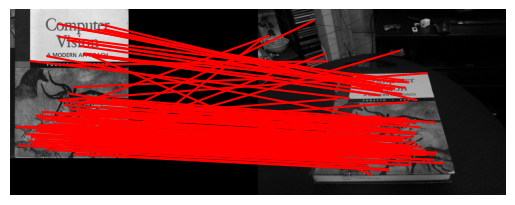

Displaying matches for ratio:  0.8  and sigma:  0.15


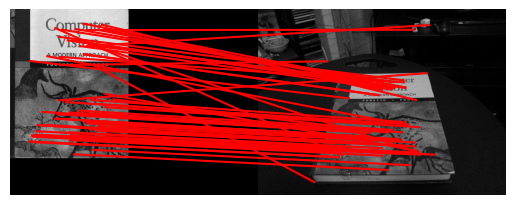

In [22]:
image1_name = "cv_cover.jpg"
image2_name = "cv_desk.png"

image1_path = os.path.join(DATA_DIR, image1_name)
image2_path = os.path.join(DATA_DIR, image2_name)

image1 = cv2.imread(image1_path)
image2 = cv2.imread(image2_path)

#bgr to rgb
if len(image1.shape) == 3 and image1.shape[2] == 3:
  image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

if len(image2.shape) == 3 and image2.shape[2] == 3:
  image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# ===== your code here! =====
# Experiment with different sigma and ratio values.
# Use displayMatches to visualize.
# Include the matched feature figures in the write-up.
ratios = [0.6, 0.7, 0.8]
sigmas = [0.05, 0.1, 0.15]

for ratio in ratios:
    for sigma in sigmas:
        displayMatched(image1, image2, ratio, sigma, path = f"ratio{ratio}_sigma{sigma}.png")

# ==== end of code ====

### Q2.1.6 (10 points):

#### Implement the function briefRot

In [44]:
def briefRot(min_deg, max_deg, deg_inc, ratio, sigma, filename):
    """
    Tests Brief with rotations.

    Input
    -----
    min_deg: minimum degree to rotate image
    max_deg: maximum degree to rotate image
    deg_inc: number of degrees to increment when iterating
    ratio: ratio for BRIEF feature descriptor
    sigma: threshold for corner detection using FAST feature detector
    filename: filename of image to rotate

    """

    if not os.path.exists(RES_DIR):
      raise RuntimeError('RES_DIR does not exist. did you run all cells?')

    # Read the image and convert bgr to rgb
    image_path = os.path.join(DATA_DIR, filename)
    image = cv2.imread(image_path)
    if len(image.shape) == 3 and image.shape[2] == 3:
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    match_degrees = [] # stores the degrees of rotation
    match_counts = [] # stores the number of matches at each degree of rotation

    for i in range(min_deg, max_deg, deg_inc):
        print(i)

        # ===== your code here! =====
        # TODO: Rotate Image (Hint: use scipy.ndimage.rotate)
        rotated_img = scipy.ndimage.rotate(image, i, reshape=True)

        # TODO: Match features in images
        matches, locs1, locs2 = matchPics(image, rotated_img, ratio, sigma)

        # TODO: visualizes matches at at least 3 different orientations
        # to include in your report
        # (Hint: use plotMatches)
        if i in [0, 30, 90, 120, 180]:
            plotMatches(image, rotated_img, matches, locs1, locs2, path = f"briefrot_rot{i}.png")

        # TODO: Update match_degrees and match_counts (see descriptions above)
        match_degrees.append(i)
        match_counts.append(len(matches))

        # ==== end of code ====

    # Save to pickle file
    matches_to_save = [match_counts, match_degrees, deg_inc]
    write_pickle(ROT_MATCHES_PATH, matches_to_save)

def dispBriefRotHist(matches_path=ROT_MATCHES_PATH):
    # Check if pickle file exists
    if not os.path.exists(matches_path):
      raise RuntimeError('matches_path does not exist. did you call briefRot?')

    # Read from pickle file
    match_counts, match_degrees, deg_inc = read_pickle(matches_path)

    # Display histogram
    # Bins are centered and separated every 10 degrees
    plt.figure()
    bins = [x - deg_inc/2 for x in match_degrees]
    bins.append(bins[-1] + deg_inc)
    plt.hist(match_degrees, bins=bins, weights=match_counts, log=True)
    #plt.hist(match_degrees, bins=[10 * (x-0.5) for x in range(37)], weights=match_counts, log=True)
    plt.title("Histogram of BREIF matches")
    plt.ylabel("# of matches")
    plt.xlabel("Rotation (deg)")
    plt.tight_layout()

    output_path = os.path.join(RES_DIR, 'histogram.png')
    plt.savefig(output_path)

#### Visualize the matches under rotation

See debugging tips in handout.


0


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


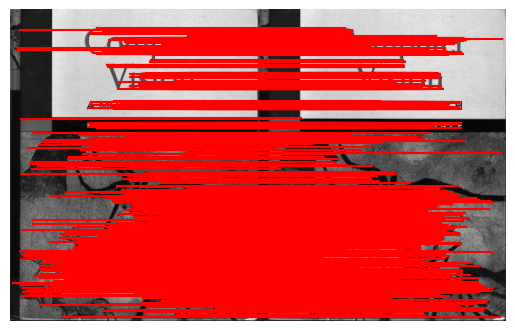

10
20
30


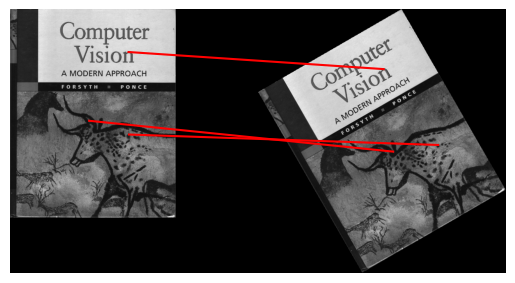

40
50
60
70
80
90


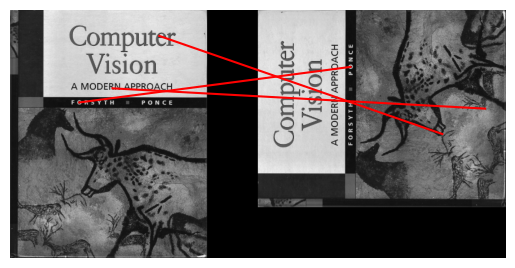

100
110
120


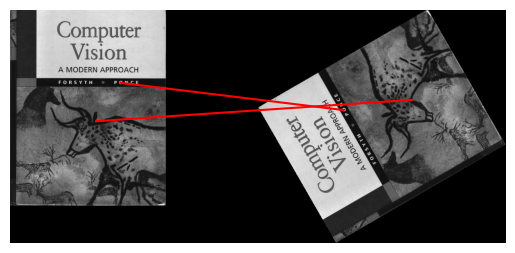

130
140
150
160
170
180


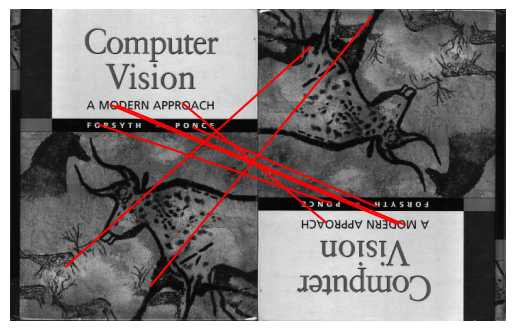

190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350


In [45]:
# defaults are:
# min_deg = 0
# max_deg = 360
# deg_inc = 10
# ratio = 0.7
# sigma = 0.15
# filename = 'cv_cover.jpg'

# Controls the rotation degrees
min_deg = 0
max_deg = 360
deg_inc = 10

# Brief feature descriptor and Fast feature detector paremeters
# (change these if you want to use different values)
ratio = 0.7
sigma = 0.15

# image to rotate and match
# (no need to change this but can if you want to experiment)
filename = 'cv_cover.jpg'

# Call briefRot
briefRot(min_deg, max_deg, deg_inc, ratio, sigma, filename)

#### Plot the histogram

See debugging tips in handout.

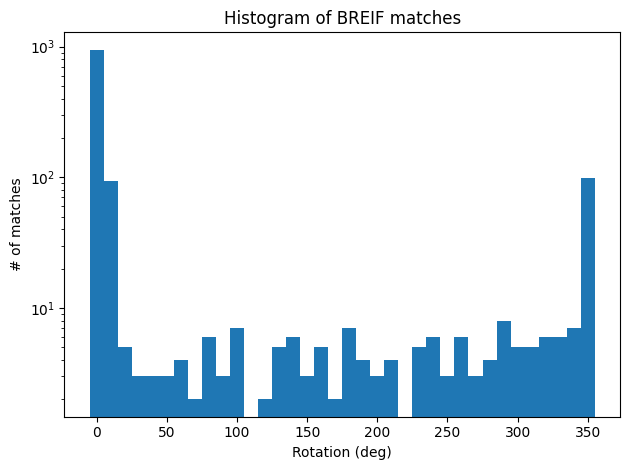

In [46]:
dispBriefRotHist()

---

> Add blockquote



Explain why you think the BRIEF descriptor behves this way:  

From the experiments, we see that BRIEF descriptor shows strong performance when the image orientation remains unchanged but performs poorly under rotation. The BRIEF descriptors are not rotation invariant hence we see the decrease in matches when the images are rotated. This happens because BRIEF directly compares intensity pairs within fixed pixel locations in the local image patch. When both images are aligned, these intensity relationships remain the same, resulting in nearly identical binary strings and giving reliable matches. However when the image is rotated the pixel locations used for BRIEF’s binary tests rotate in the image, but the descriptor’s sampling pattern does not. This mismatch causes the intensity pairwise comparisons to give completely different binary patterns resulting in less number of matches.

---

### Q2.1.7.1 (Extra Credit - 5 points):

Design a fix to make BRIEF more rotation invariant. Feel free to make any helper functions as necessary. But you cannot use any additional OpenCV or Scikit-Image functions.

In [66]:
# ===== your code here! =====
# TODO: Define any helper functions here
# (Feel free to put anything in its own cell)

def computeKeypointOrientation(img, locs, patchWidth=9):
    halfWidth = patchWidth // 2
    m, n = img.shape
    orientations = []

    for loc in locs:
        y, x = int(loc[0]), int(loc[1])

        if y < halfWidth or y >= m - halfWidth or x < halfWidth or x >= n - halfWidth:
            orientations.append(0)
            continue

        patch = img[y-halfWidth:y+halfWidth+1, x-halfWidth:x+halfWidth+1].astype(float)

        if patch.size == 0:
            orientations.append(0)
            continue

        yy, xx = np.meshgrid(np.arange(-halfWidth, halfWidth+1),
                             np.arange(-halfWidth, halfWidth+1), indexing='ij')

        m01 = np.sum(yy * patch)
        m10 = np.sum(xx * patch)

        if m01 == 0 and m10 == 0:
            orientations.append(0)
        else:
            angle = np.arctan2(m01, m10)
            orientations.append(angle)

    return np.array(orientations)


def rotatePattern(compareX, compareY, angle, patchWidth):
    halfWidth = patchWidth // 2

    col1 = (compareX % patchWidth) - halfWidth
    row1 = (compareX // patchWidth) - halfWidth
    col2 = (compareY % patchWidth) - halfWidth
    row2 = (compareY // patchWidth) - halfWidth

    cos_a = np.cos(angle)
    sin_a = np.sin(angle)

    row1_rot = row1 * cos_a - col1 * sin_a
    col1_rot = row1 * sin_a + col1 * cos_a
    row2_rot = row2 * cos_a - col2 * sin_a
    col2_rot = row2 * sin_a + col2 * cos_a

    row1_rot = np.clip(row1_rot + halfWidth, 0, patchWidth - 1)
    col1_rot = np.clip(col1_rot + halfWidth, 0, patchWidth - 1)
    row2_rot = np.clip(row2_rot + halfWidth, 0, patchWidth - 1)
    col2_rot = np.clip(col2_rot + halfWidth, 0, patchWidth - 1)

    compareX_rot = (row1_rot * patchWidth + col1_rot).astype(int)
    compareY_rot = (row2_rot * patchWidth + col2_rot).astype(int)

    compareX_rot = np.clip(compareX_rot, 0, patchWidth*patchWidth - 1)
    compareY_rot = np.clip(compareY_rot, 0, patchWidth*patchWidth - 1)

    return compareX_rot, compareY_rot


def computeOrientedBrief(img, locs, patchWidth=9, nbits=256):
    compareX, compareY = makeTestPattern(patchWidth, nbits)
    m, n = img.shape
    halfWidth = patchWidth // 2

    locs = np.array(list(filter(lambda x: halfWidth <= x[0] < m-halfWidth and
                                           halfWidth <= x[1] < n-halfWidth, locs)))

    if len(locs) == 0:
        return np.array([]), locs

    orientations = computeKeypointOrientation(img, locs, patchWidth)

    desc = []
    valid_locs = []
    for loc, angle in zip(locs, orientations):
        try:
            compareX_rot, compareY_rot = rotatePattern(compareX, compareY, angle, patchWidth)

            descriptor = [computePixel(img, cx, cy, patchWidth, loc)
                         for cx, cy in zip(compareX_rot, compareY_rot)]
            desc.append(descriptor)
            valid_locs.append(loc)
        except (IndexError, ValueError):
            continue

    if len(desc) == 0:
        return np.array([]), np.array([])

    return np.array(desc), np.array(valid_locs)


def bonus_compute_descriptors(image, ratio, sigma, rotation_invariant=True):
    if len(image.shape) == 3:
        image_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        image_gray = image

    image_gray = image_gray.astype(np.float64)
    image_gray = cv2.GaussianBlur(image_gray, (3, 3), 0.5)
    image_gray = image_gray.astype(np.uint8)

    locs = corner_detection(image_gray, sigma)

    if len(locs) == 0:
        return np.array([]), np.array([])

    if rotation_invariant:
        desc, locs = computeOrientedBrief(image_gray, locs)
    else:
        desc, locs = computeBrief(image_gray, locs)

    return locs, desc


def bonus_match_descriptors(desc1, desc2, ratio):
    if len(desc1) == 0 or len(desc2) == 0:
        return np.array([])
    matches = briefMatch(desc1, desc2, ratio)
    return matches


# TODO: Feel free to modify the inputs and the function body as necessary
# This is only an outline
def briefRotInvEc(min_deg, max_deg, deg_inc, ratio, sigma, filename):
    """
    Rotation invariant Brief.

    Input
    -----
    min_deg: minimum degree to rotate image
    max_deg: maximum degree to rotate image
    deg_inc: number of degrees to increment when iterating
    ratio: ratio for BRIEF feature descriptor
    sigma: threshold for corner detection using FAST feature detector
    filename: filename of image to rotate

    """

    if not os.path.exists(RES_DIR):
      raise RuntimeError('RES_DIR does not exist. did you run all cells?')

    #Read the image and convert bgr to rgb
    image_path = os.path.join(DATA_DIR, filename)
    image = cv2.imread(image_path)
    if len(image.shape) == 3 and image.shape[2] == 3:
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    match_degrees = [] # stores the degrees of rotation
    match_counts = [] # stores the number of matches at each degree of rotation

    locs_orig, desc_orig = bonus_compute_descriptors(image, ratio, sigma)

    for i in range(min_deg, max_deg, deg_inc):
        print(i)

        # TODO: Rotate Image (Hint: use scipy.ndimage.rotate)
        rotated_img = scipy.ndimage.rotate(image, i, reshape=True)

        # TODO: Brief matcher that is rotation invariant
        # Feel free to define additional helper functions as necessary
        locs_rot, desc_rot = bonus_compute_descriptors(rotated_img, ratio, sigma)

        if len(locs_rot) == 0 or len(desc_rot) == 0:
            print(f"  No keypoints detected at {i} degrees")
            match_degrees.append(i)
            match_counts.append(0)
            continue

        matches = bonus_match_descriptors(desc_orig, desc_rot, ratio)
        num_matches = len(matches)

        # TODO: visualizes matches at at least 3 different orientations
        # to include in your report
        # (Hint: use plotMatches)
        if i in [0, 90, 120, 180, 270]:
            plotMatches(image, rotated_img, matches, locs_orig, locs_rot, path = f"bonus2_1_7_1_rot{i}.png")

        # TODO: Update match_degrees and match_counts (see descriptions above)
        match_degrees.append(i)
        match_counts.append(num_matches)

    # Save to pickle file
    matches_to_save = [match_counts, match_degrees, deg_inc]
    write_pickle(ROT_INV_MATCHES_PATH, matches_to_save)

# ==== end of code ====

#### Visualize your implemented function


0


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


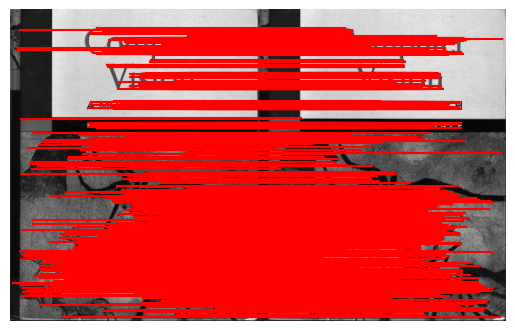

10
20
30


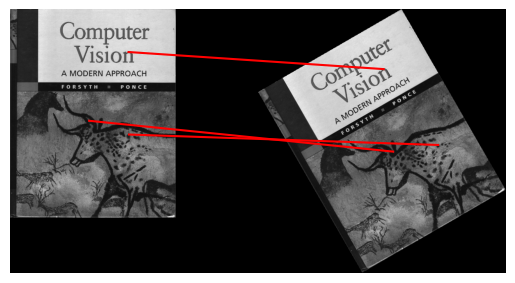

40
50
60
70
80
90


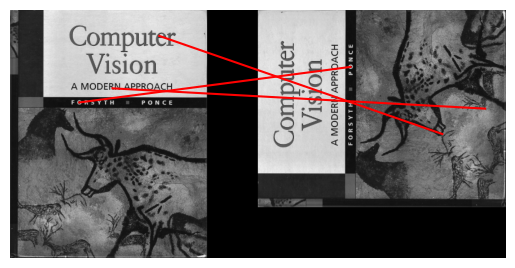

100
110
120


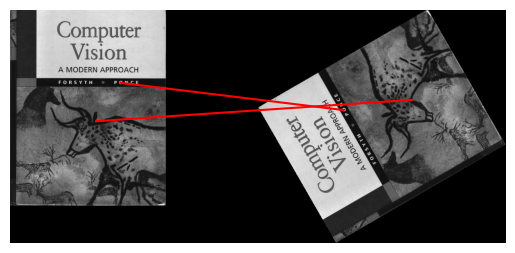

130
140
150
160
170
180


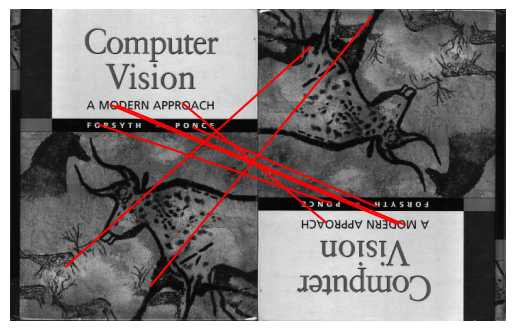

190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350


In [67]:
min_deg = 0
max_deg = 360
deg_inc = 10
filename = 'cv_cover.jpg'

# ===== your code here! =====
# TODO: Call briefRotInvEc and visualize
# Controls the rotation degrees

# Call briefRot
briefRot(min_deg, max_deg, deg_inc, ratio, sigma, filename)

# ==== end of code ====


#### Plot Histogram

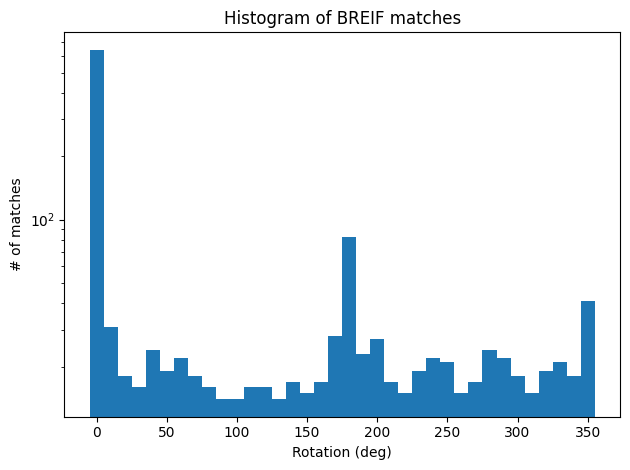

In [68]:
dispBriefRotHist(matches_path=ROT_INV_MATCHES_PATH)

---

Compare the histograms with an without rotation invariance. Explain your rotation invariant design and how you selected any parameters that you used:   

The comparison between the two histograms with and without rotation invariance clearly shows the improvement brought by orientation compensation in BRIEF. Without rotation invariance the number of matches drops drastically as rotation increases — strong peaks appear only near 0 degree and 360 degree, indicating that BRIEF fails to match correctly once the image is rotated beyond small angles. We already looked at why this is happening in the previous question. With rotation invariance the match count remains much more consistent across angles and even peaking around 180. This improvement results from aligning each keypoint from BRIEF sampling pattern with its local orientation before computing descriptors. The orientation was estimated using the intensity centroid method by computing the first order image moments within a local patch to determine the dominant gradient direction. The BRIEF pattern for the patch was then rotated accordingly, making descriptors invariant to global rotation.

Hyper params ratio = 0.7 and sigma = 0.15 were kept the same as previous question to allow consistent comparison. These are also good values for ratio and sigma as seen in the ablation study in previous questions.

---

### Q2.1.7.2 (Extra Credit - 5 points):

Design a fix to make BRIEF more scale invariant. Feel free to make any helper functions as necessary. But you cannot use any additional OpenCV or Scikit-Image functions.


In [72]:
# ===== your code here! =====
# TODO: Define any helper functions here
# (Feel free to put anything in its own cell)
def estimateLocalScale(img, locs, base_patch=9):
    scales = []
    halfWidth = base_patch // 2
    m, n = img.shape

    for loc in locs:
        y, x = int(loc[0]), int(loc[1])

        if y < halfWidth*2 or y >= m - halfWidth*2 or x < halfWidth*2 or x >= n - halfWidth*2:
            scales.append(1.0)
            continue

        # Check intensity variation at different scales
        patch_small = img[y-halfWidth:y+halfWidth+1, x-halfWidth:x+halfWidth+1]
        patch_large = img[y-halfWidth*2:y+halfWidth*2+1, x-halfWidth*2:x+halfWidth*2+1]

        var_small = np.var(patch_small) if patch_small.size > 0 else 0
        var_large = np.var(cv2.resize(patch_large, (base_patch, base_patch))) if patch_large.size > 0 else 0

        # Estimate scale based on which has more structure
        if var_small > var_large * 0.8:
            scales.append(1.0)
        else:
            scales.append(1.5)

    return np.array(scales)


def computeAdaptiveBrief(img, locs, base_patch=9, nbits=256):
    m, n = img.shape
    halfWidth = base_patch * 2

    # Filter valid locations
    valid_mask = (locs[:, 0] >= halfWidth) & (locs[:, 0] < m - halfWidth) & \
                 (locs[:, 1] >= halfWidth) & (locs[:, 1] < n - halfWidth)
    locs = locs[valid_mask]

    if len(locs) == 0:
        return np.array([]), np.array([])

    scales = estimateLocalScale(img, locs, base_patch)

    desc_list = []
    valid_locs = []

    compareX, compareY = makeTestPattern(base_patch, nbits)

    for loc, scale in zip(locs, scales):
        y, x = int(loc[0]), int(loc[1])

        # Extract patch at appropriate scale
        patch_size = int(base_patch * scale)
        half = patch_size // 2

        if y < half or y >= m - half or x < half or x >= n - half:
            continue

        patch = img[y-half:y+half+1, x-half:x+half+1]

        # Resize to standard size for descriptor computation
        if patch.shape[0] != base_patch or patch.shape[1] != base_patch:
            patch = cv2.resize(patch, (base_patch, base_patch), interpolation=cv2.INTER_LINEAR)

        # Compute descriptor on normalized patch
        descriptor = [computePixel(patch, cx, cy, base_patch, [base_patch//2, base_patch//2])
                     for cx, cy in zip(compareX, compareY)]

        desc_list.append(descriptor)
        valid_locs.append(loc)

    if len(desc_list) == 0:
        return np.array([]), np.array([])

    return np.array(desc_list), np.array(valid_locs)


def computeScaleInvariantDescriptors(image, ratio, sigma):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image

    # Smooth slightly for stability
    gray = cv2.GaussianBlur(gray, (3, 3), 0.8)

    locs = corner_detection(gray, sigma)

    if len(locs) == 0:
        return np.array([]), np.array([])

    desc, locs = computeAdaptiveBrief(gray, locs)

    return desc, locs


def matchPicsScaleInvariant(image1, image2, ratio, sigma):
    desc1, locs1 = computeScaleInvariantDescriptors(image1, ratio, sigma)
    desc2, locs2 = computeScaleInvariantDescriptors(image2, ratio, sigma)

    if len(desc1) == 0 or len(desc2) == 0:
        return np.array([]), locs1, locs2

    matches = briefMatch(desc1, desc2, ratio)

    return matches, locs1, locs2

# TODO: Modify the inputs and the function body as necessary
def briefScaleInvEc(ratio, sigma, filename):

    #Read the image and convert bgr to rgb
    image_path = os.path.join(DATA_DIR, filename)
    image = cv2.imread(image_path)
    if len(image.shape) == 3 and image.shape[2] == 3:
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    match_scales = [] # stores the scaling factors
    match_counts = [] # stores the number of matches at each scaling factor

    for i in [0.5, 1, 2]:
        # Scale Image
        image_scale = cv2.resize(image,(int(image.shape[1]/(2**i)),
                                        int(image.shape[0]/(2**i))),
                                 interpolation = cv2.INTER_AREA)

        # TODO: Brief matcher that is scale invariant
        # Feel free to define additional helper functions as necessary
        matches, locs1, locs2 = matchPicsScaleInvariant(image, image_scale, ratio, sigma)

        # Compare to regular matchPics
        matches_orig, locs1_orig, locs2_orig = matchPics(image,
                                                         image_scale,
                                                         ratio, sigma)

        print('plotting non-scale invariant scale: ', 2**i)
        plotMatches(image, image_scale, matches_orig, locs1_orig,
                    locs2_orig, path = f"bonus2_1_7_2_nonscale{i}.png")
        print('plotting scale-invariant: ', 2**i)
        plotMatches(image, image_scale, matches, locs1, locs2, path = f"bonus2_1_7_2_scale{i}.png")

# ==== end of code ====

#### Visualize your implemented function

/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


plotting non-scale invariant scale:  1.4142135623730951


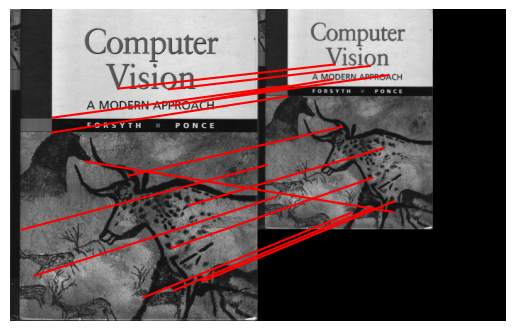

plotting scale-invariant:  1.4142135623730951


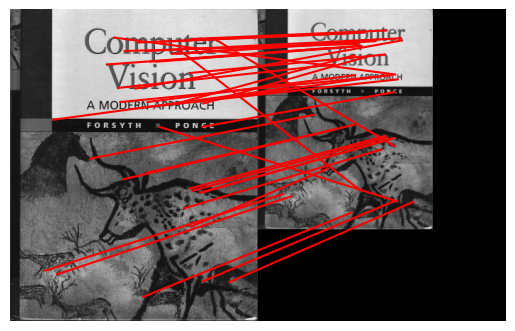

plotting non-scale invariant scale:  2


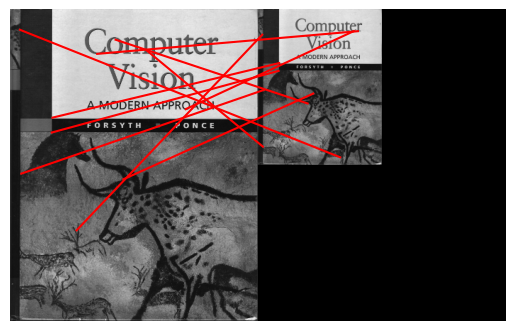

plotting scale-invariant:  2


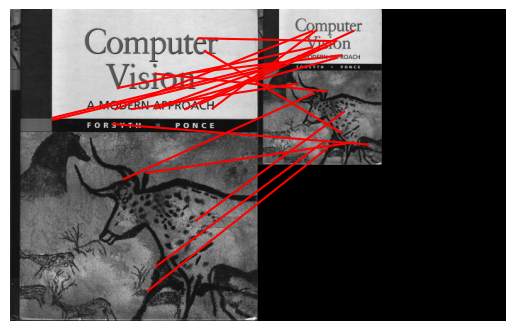

plotting non-scale invariant scale:  4


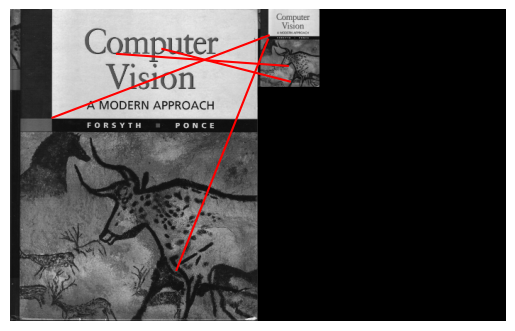

plotting scale-invariant:  4


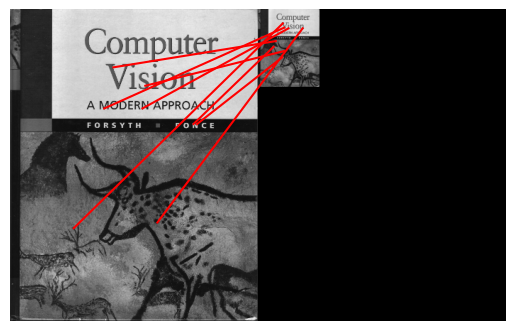

In [73]:
# ===== your code here! =====
# TODO: Call briefScaleInvEc and visualize
# You may change any parameters and the function body as necessary

filename = 'cv_cover.jpg'

ratio = 0.7
sigma = 0.15

briefScaleInvEc(ratio, sigma, filename)
# ==== end of code ====

---

Explain your scale invariant design and how you selected any parameters that you used:

Hyper params ratio = 0.7 and sigma = 0.15 were kept the same as previous question to allow consistent comparison. These are also good values for ratio and sigma as seen in the ablation study in previous questions.
---


## Q2.2 Homography Computation

### Q2.2.1 (15 Points):

Implement the function computeH

In [10]:
def computeH(x1, x2):
    """
    Compute the homography between two sets of points

    Input
    -----
    x1, x2: Sets of points

    Returns
    -------
    H2to1: 3x3 homography matrix that best transforms x2 to x1
    """

    if x1.shape != x2.shape:
        raise RuntimeError('number of points do not match')

    # ===== your code here! =====
    # TODO: Compute the homography between two sets of points
    N = x1.shape[0]
    A = []

    for i in range(N):
        x, y = x2[i, 0], x2[i, 1]
        xp, yp = x1[i, 0], x1[i, 1]

        A.append([-x, -y, -1,  0,  0,  0, x * xp, y * xp, xp])
        A.append([ 0,  0,  0, -x, -y, -1, x * yp, y * yp, yp])

    A = np.asarray(A)
    U, S, Vt = scipy.linalg.svd(A)
    h = Vt[-1, :]
    H2to1 = h.reshape(3, 3)
    H2to1 = H2to1 / H2to1[-1, -1]

    # ==== end of code ====

    return H2to1

### Q2.2.2 (10 points):

Implement the function computeH_norm

In [5]:
def computeH_norm(x1, x2):
    """
    Compute the homography between two sets of points using normalization

    Input
    -----
    x1, x2: Sets of points

    Returns
    -------
    H2to1: 3x3 homography matrix that best transforms x2 to x1
    """

    # ===== your code here! =====

    # TODO: Compute the centroid of the points
    c1 = np.mean(x1, axis=0)
    c2 = np.mean(x2, axis=0)


    # TODO: Shift the origin of the points to the centroid
    x1_shifted = x1 - c1
    x2_shifted = x2 - c2


    # TODO: Normalize the points so that the largest distance from the
    # origin is equal to sqrt(2)
    max_dist1 = np.max(np.sqrt(np.sum(x1_shifted**2, axis=1)))
    max_dist2 = np.max(np.sqrt(np.sum(x2_shifted**2, axis=1)))

    scale1 = np.sqrt(2) / max_dist1
    scale2 = np.sqrt(2) / max_dist2


    # TODO: Similarity transform 1
    T1 = np.array([
        [scale1, 0, -scale1 * c1[0]],
        [0, scale1, -scale1 * c1[1]],
        [0, 0, 1]
    ])

    # TODO: Similarity transform 2
    T2 = np.array([
        [scale2, 0, -scale2 * c2[0]],
        [0, scale2, -scale2 * c2[1]],
        [0, 0, 1]
    ])

    # TODO: Compute homography
    x1_h = np.hstack((x1, np.ones((x1.shape[0], 1))))
    x2_h = np.hstack((x2, np.ones((x2.shape[0], 1))))

    x1_norm = (T1 @ x1_h.T).T[:, :2]
    x2_norm = (T2 @ x2_h.T).T[:, :2]

    H_norm = computeH(x1_norm, x2_norm)


    # TODO: Denormalization
    H2to1 = np.linalg.inv(T1) @ H_norm @ T2
    H2to1 = H2to1 / H2to1[-1, -1]

    # ==== end of code ====

    return H2to1

### Q2.2.3 (25 points):

Implement RANSAC

In [6]:
def computeH_ransac(locs1, locs2, max_iters, inlier_tol):
    """
    Estimate the homography between two sets of points using ransac

    Input
    -----
    locs1, locs2: Lists of points
    max_iters: the number of iterations to run RANSAC for
    inlier_tol: the tolerance value for considering a point to be an inlier

    Returns
    -------
    bestH2to1: 3x3 homography matrix that best transforms locs2 to locs1
    inliers: indices of RANSAC inliers

    """

    # ===== your code here! =====

    # TODO:
    # Compute the best fitting homography using RANSAC
    # given a list of matching points locs1 and loc2
    N = locs1.shape[0]
    bestH2to1 = None
    best_inliers = np.zeros(N, dtype=bool)
    max_inliers = 0

    for i in range(max_iters):
        idx = np.random.choice(N, 4, replace=False)
        x1_sample = locs1[idx]
        x2_sample = locs2[idx]

        try:
            H_candidate = computeH_norm(x1_sample, x2_sample)
        except np.linalg.LinAlgError:
            continue

        x2_hom = np.hstack((locs2, np.ones((N, 1))))
        proj_x2 = (H_candidate @ x2_hom.T).T
        proj_x2 = proj_x2[:, :2] / proj_x2[:, 2][:, np.newaxis]

        dists = np.linalg.norm(proj_x2 - locs1, axis=1)

        inliers = dists < inlier_tol
        num_inliers = np.sum(inliers)

        if num_inliers > max_inliers:
            max_inliers = num_inliers
            best_inliers = inliers
            bestH2to1 = H_candidate

    if np.sum(best_inliers) >= 4:
        bestH2to1 = computeH_norm(locs1[best_inliers], locs2[best_inliers])

    # ==== end of code ====

    return bestH2to1, best_inliers

### Q2.2.4 (10 points):

#### Implement the function compositeH

In [7]:
def compositeH(H2to1, template, img):
    """
    Returns the composite image.

    Input
    -----
    H2to1: Homography from image to template
    template: template image to be warped
    img: background image

    Returns
    -------
    composite_img: Composite image

    """

    # ===== your code here! =====
    # TODO: Create a composite image after warping the template image on top
    # of the image using the homography
    h_img, w_img, _ = img.shape
    warped_template = cv2.warpPerspective(template, H2to1, (w_img, h_img))

    if warped_template.dtype != np.uint8:
        warped_template = np.clip(warped_template, 0, 255).astype(np.uint8)
    if img.dtype != np.uint8:
        img = np.clip(img, 0, 255).astype(np.uint8)

    mask = np.any(warped_template > 0, axis=2).astype(np.uint8)
    mask_inv = 1 - mask
    mask_3c = np.dstack([mask]*3)
    mask_inv_3c = np.dstack([mask_inv]*3)
    img_bg = img * mask_inv_3c
    warped_fg = warped_template * mask_3c
    composite_img = img_bg + warped_fg
    composite_img = np.clip(composite_img, 0, 255).astype(np.uint8)
    # ==== end of code ====

    return composite_img

#### Implement the function warpImage

In [8]:
def warpImage(ratio, sigma, max_iters, inlier_tol, path = "warped.png"):
    """
    Warps hp_cover.jpg onto the book cover in cv_desk.png.

    Input
    -----
    ratio: ratio for BRIEF feature descriptor
    sigma: threshold for corner detection using FAST feature detector
    max_iters: the number of iterations to run RANSAC for
    inlier_tol: the tolerance value for considering a point to be an inlier

    """

    hp_cover = skimage.io.imread(os.path.join(DATA_DIR, 'hp_cover.jpg'))
    cv_cover = skimage.io.imread(os.path.join(DATA_DIR, 'cv_cover.jpg'))
    cv_desk = skimage.io.imread(os.path.join(DATA_DIR, 'cv_desk.png'))
    cv_desk = cv_desk[:, :, :3]

    # ===== your code here! =====

    # TODO: match features between cv_desk and cv_cover using matchPics
    matches, locs1, locs2 = matchPics(cv_desk, cv_cover, ratio, sigma)
    locs1 = locs1[:, [1, 0]]
    locs2 = locs2[:, [1, 0]]
    matched_pts1 = locs1[matches[:, 0]]
    matched_pts2 = locs2[matches[:, 1]]

    # TODO: Scale matched pixels in cv_cover to size of hp_cover
    scale_x = hp_cover.shape[1] / cv_cover.shape[1]
    scale_y = hp_cover.shape[0] / cv_cover.shape[0]
    matched_pts2_scaled = matched_pts2 * np.array([scale_x, scale_y])

    # TODO: Get homography by RANSAC using computeH_ransac
    H2to1, inliers = computeH_ransac(matched_pts1, matched_pts2_scaled, max_iters, inlier_tol)

    # TODO: Overlay using compositeH to return composite_img
    composite_img = compositeH(H2to1, hp_cover, cv_desk)

    # ==== end of code ====
    plt.imshow(composite_img)
    plt.axis("off")
    plt.tight_layout()
    plt.savefig(path, bbox_inches="tight")
    plt.show()

#### Visualize composite image

/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


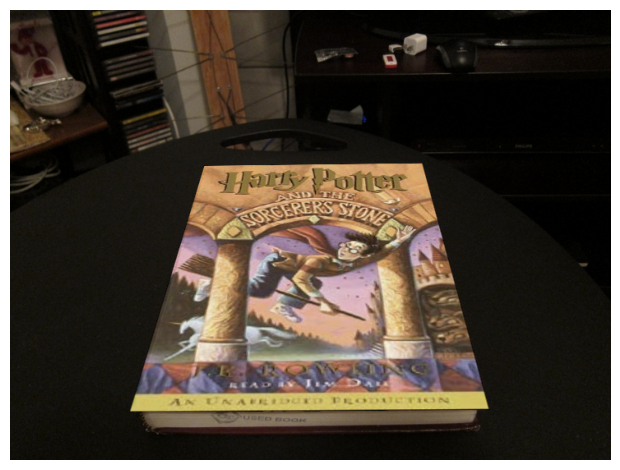

In [38]:
# defaults are:
# ratio = 0.7
# sigma = 0.15
# max_iters = 600
# inlier_tol = 1.0

# (no need to change this but can if you want to experiment)
ratio = 0.7
sigma = 0.15
max_iters = 600
inlier_tol = 1.0

warpImage(ratio, sigma, max_iters, inlier_tol, path = "warpimage.png")

### Q2.2.5 (10 points):

Conduct ablation study with various max_iters and inlier_tol values. Plot the result images and explain the effect of these two parameters respectively.

Running RANSAC with max_iters=50, inlier_tol=0.01


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


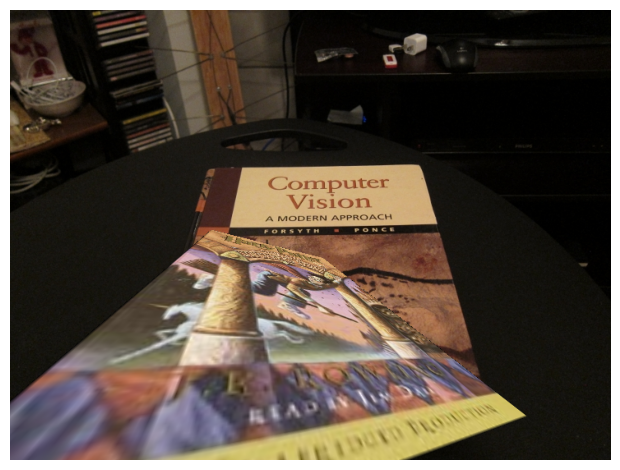

Running RANSAC with max_iters=50, inlier_tol=0.05


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


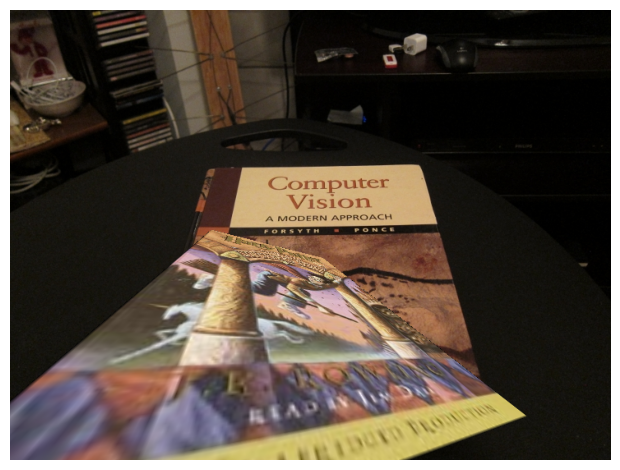

Running RANSAC with max_iters=50, inlier_tol=1.0


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


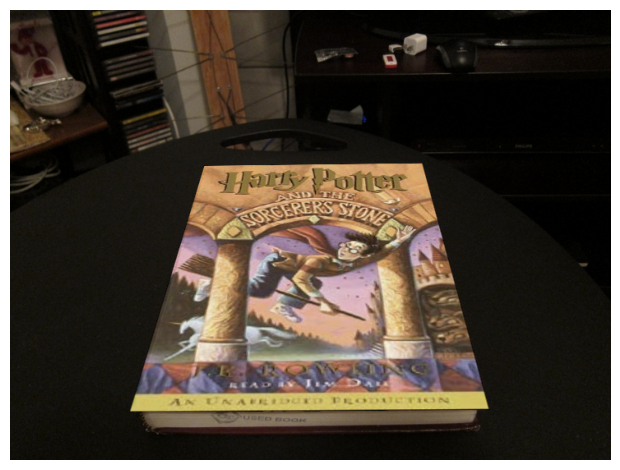

Running RANSAC with max_iters=50, inlier_tol=5.0


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


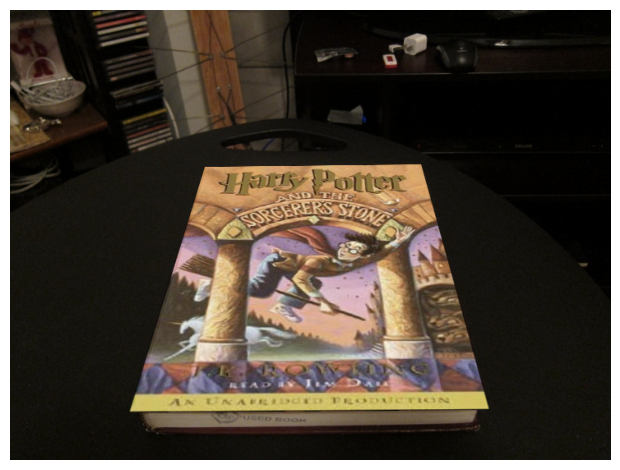

Running RANSAC with max_iters=100, inlier_tol=0.01


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


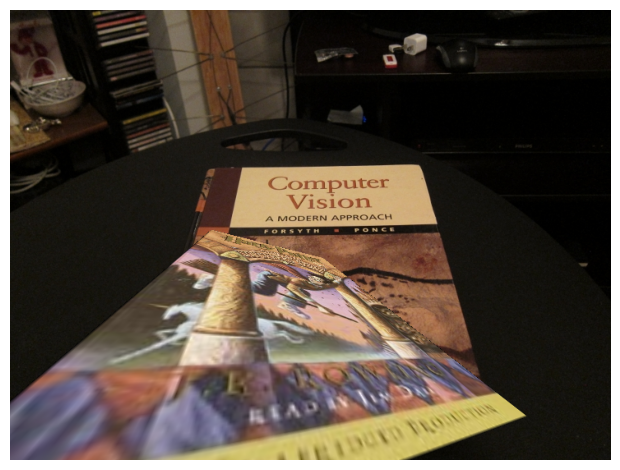

Running RANSAC with max_iters=100, inlier_tol=0.05


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


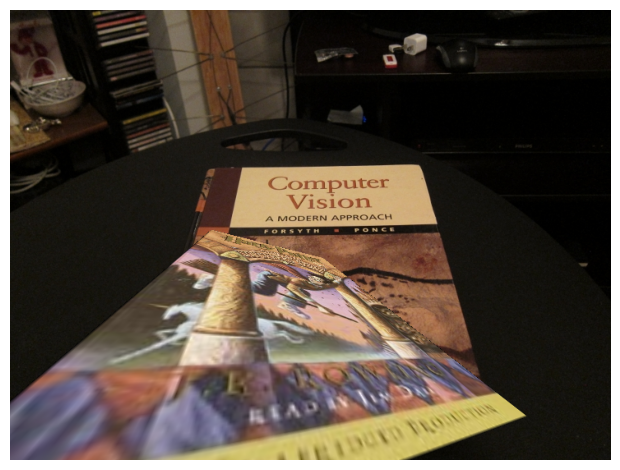

Running RANSAC with max_iters=100, inlier_tol=1.0


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


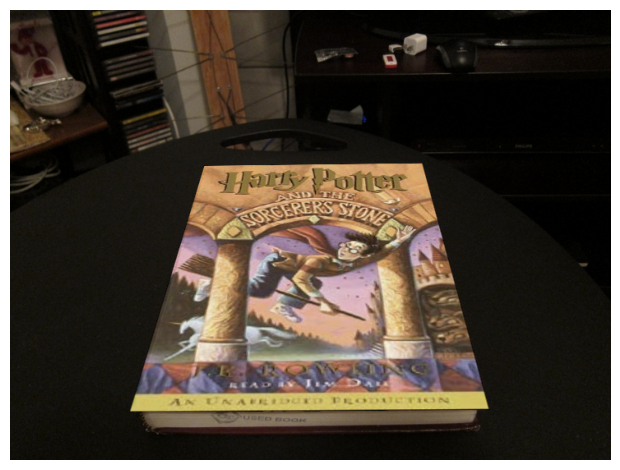

Running RANSAC with max_iters=100, inlier_tol=5.0


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


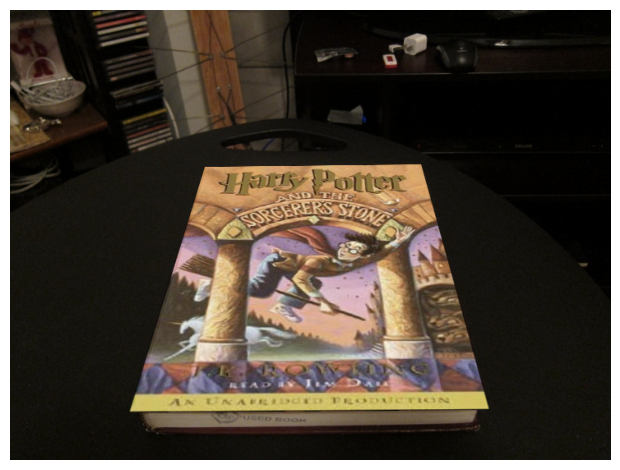

Running RANSAC with max_iters=600, inlier_tol=0.01


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


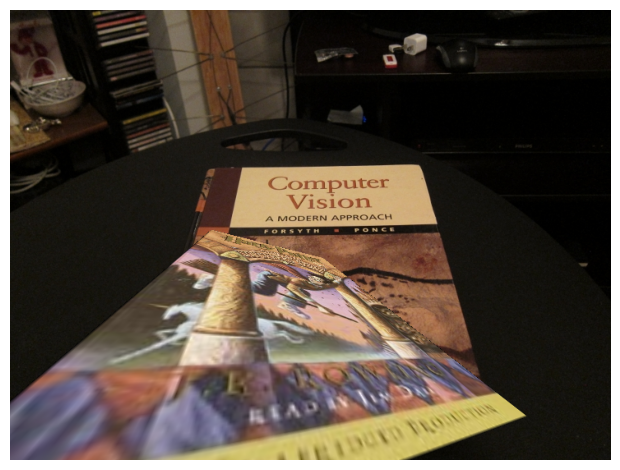

Running RANSAC with max_iters=600, inlier_tol=0.05


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


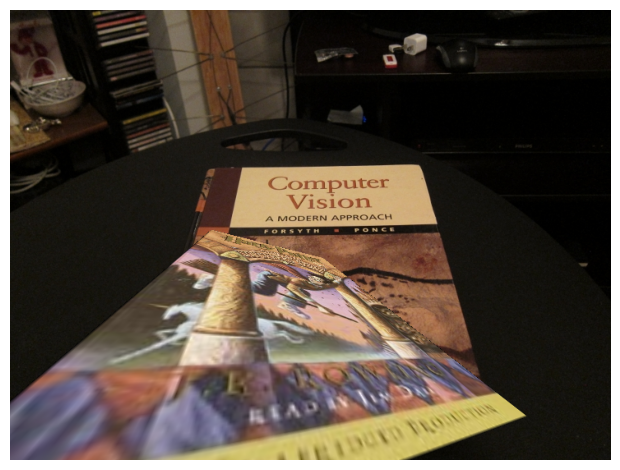

Running RANSAC with max_iters=600, inlier_tol=1.0


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


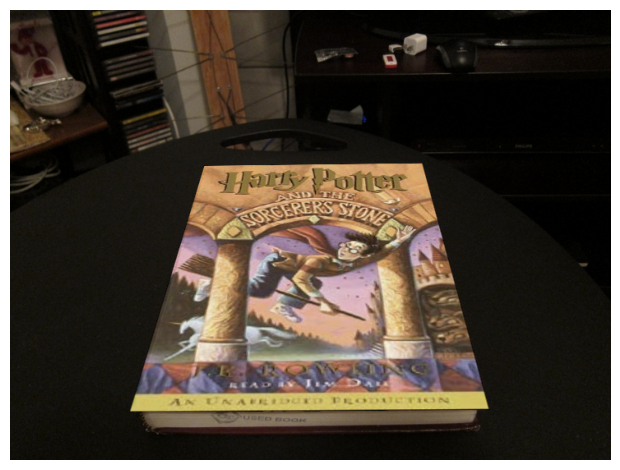

Running RANSAC with max_iters=600, inlier_tol=5.0


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


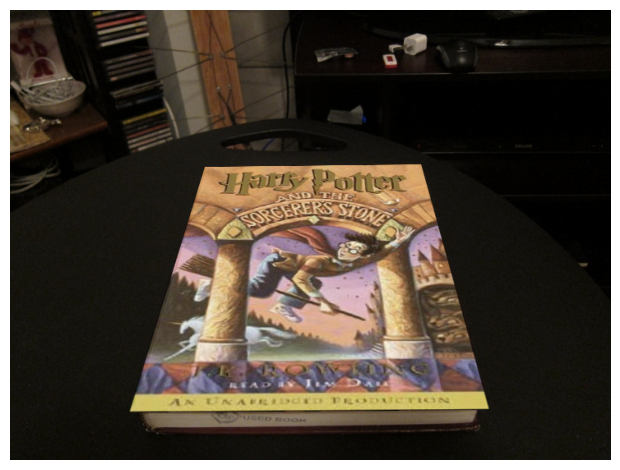

Running RANSAC with max_iters=1000, inlier_tol=0.01


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


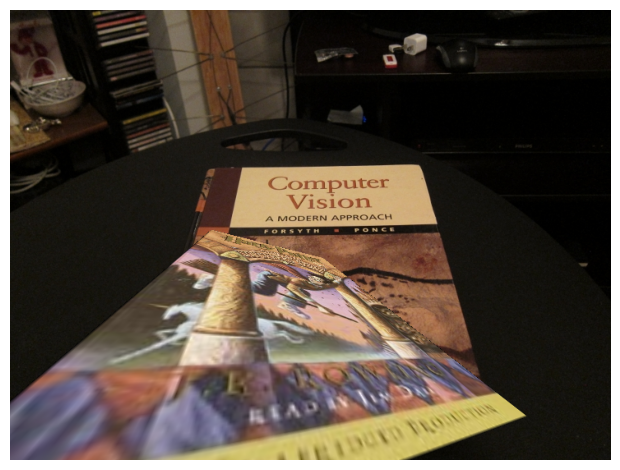

Running RANSAC with max_iters=1000, inlier_tol=0.05


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


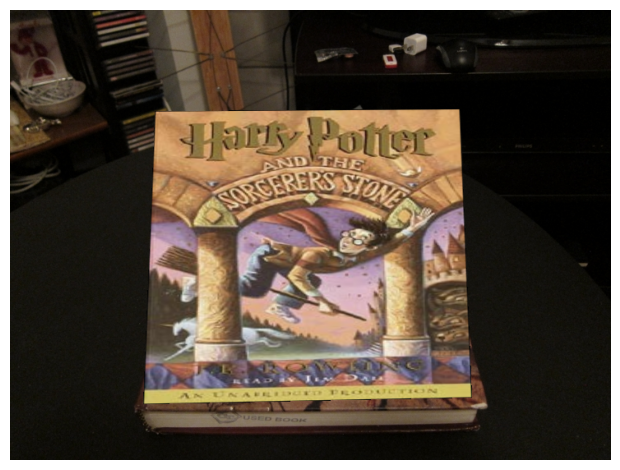

Running RANSAC with max_iters=1000, inlier_tol=1.0


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


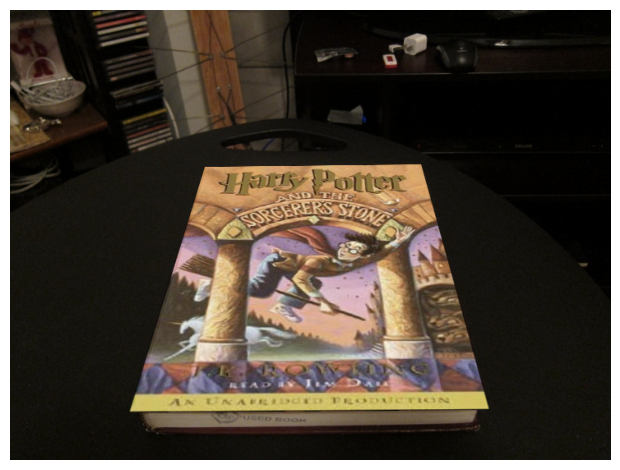

Running RANSAC with max_iters=1000, inlier_tol=5.0


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


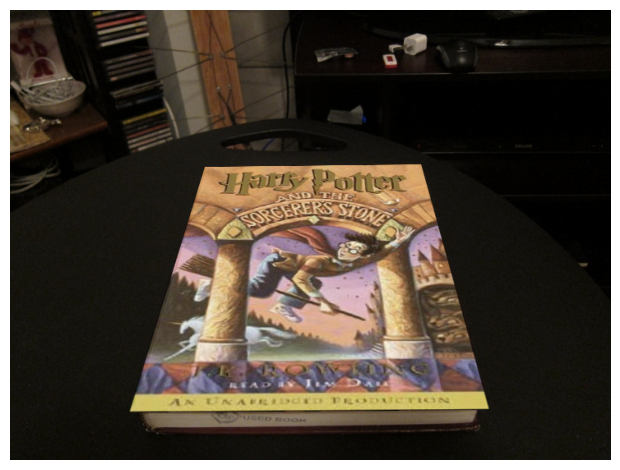

Running RANSAC with max_iters=2000, inlier_tol=0.01


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


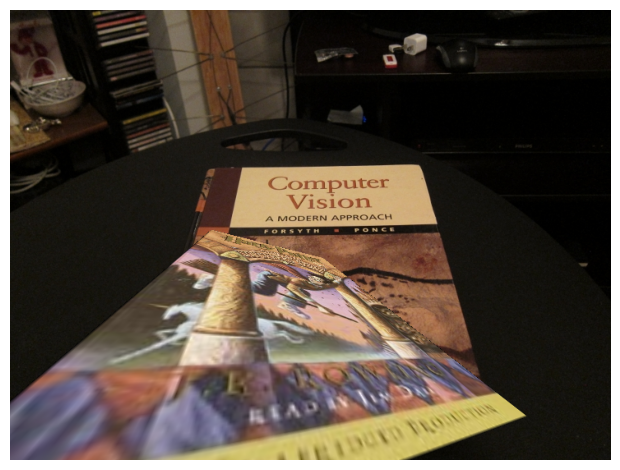

Running RANSAC with max_iters=2000, inlier_tol=0.05


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


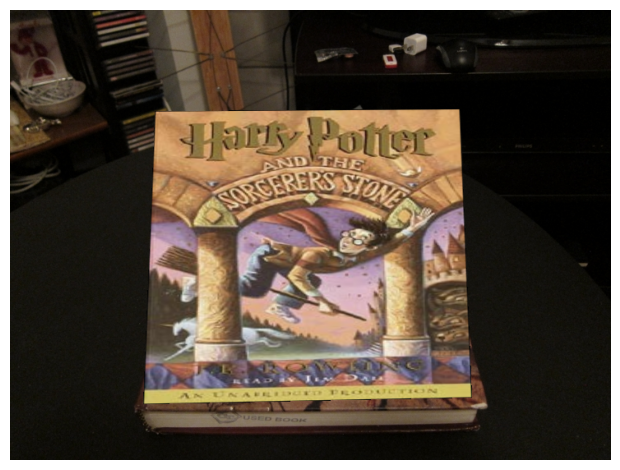

Running RANSAC with max_iters=2000, inlier_tol=1.0


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


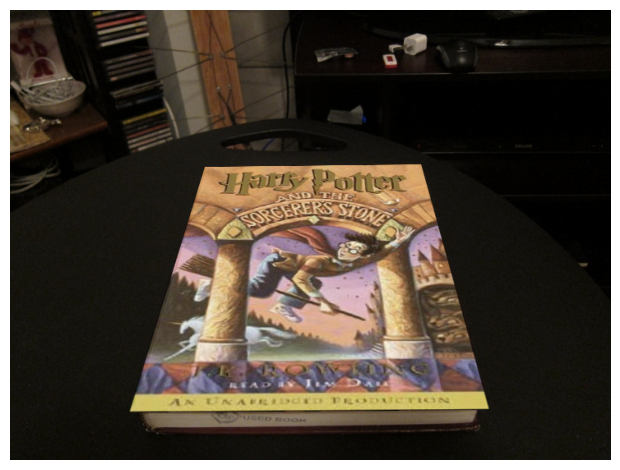

Running RANSAC with max_iters=2000, inlier_tol=5.0


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


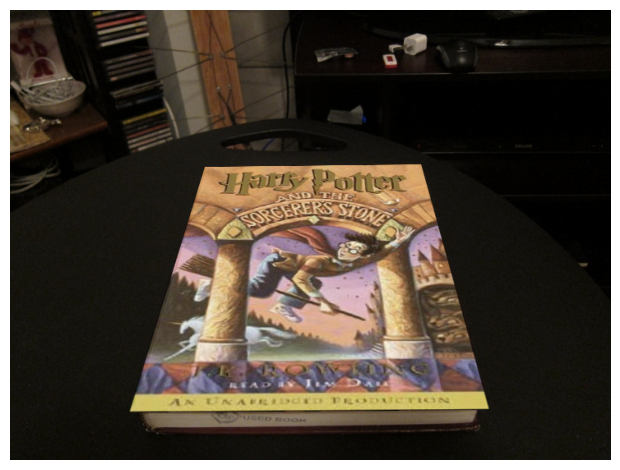

In [39]:
# ===== your code here! =====
# Experiment with different max_iters and inlier_tol values.
# Include the result images in the write-up.
ratio = 0.7
sigma = 0.15
max_iters_list = [50, 100, 600, 1000, 2000]
inlier_tol_list = [0.01, 0.05, 1.0, 5.0]

for max_iters in max_iters_list:
    for inlier_tol in inlier_tol_list:
        print(f"Running RANSAC with max_iters={max_iters}, inlier_tol={inlier_tol}")
        warpImage(ratio, sigma, max_iters, inlier_tol, path = f"iter{max_iters}_inlier{inlier_tol}.png")

# ==== end of code ====

---

Explain the effect of max_iters and inlier_tol:

The ablation study shows the effects of two RANSAC parameters max\_iters  = {50, 100, 600, 1000, 2000} and inlier\_tol = {0.01, 0.05, 1.0, 5.0}. The max\_iters parameter controls how many random samples RANSAC tests to find the best homography model. We see that increasing iterations from 50 to 2000 improves the chances of finding an optimal solution, with not much in the final image beyond 1000 iterations as seen across all rows. The inlier\_tol parameter defines the maximum reprojection error (in pixels) for classifying a match as an inlier. A very tight tolerances (0.01) require very high-quality matches which seems to be unavailable, moderate tolerances (0.05-1.0) balance accuracy with robustness. We do not see much change when changing from 1 to 5. The optimal configuration seems to be max\_iters = 1000 and inlier\_tol = 0.05-1.0, providing stable warping results without excessive computation.


---

# Q3 Create a Simple Panorama

## Q3.1 Create a panorama (10 points):

#### Implement the function createPanorama

In [74]:
def createPanorama(left_im, right_im, ratio, sigma, max_iters, inlier_tol):
    """
    Create a panorama augmented reality application by computing a homography
    and stitching together a left and right image.

    Input
    -----
    left_im: left image
    right_im: right image
    ratio: ratio for BRIEF feature descriptor
    sigma: threshold for corner detection using FAST feature detector
    max_iters: the number of iterations to run RANSAC for
    inlier_tol: the tolerance value for considering a point to be an inlier

    Returns
    -------
    panorama_im: Stitched together panorama

    """

    # ===== your code here! =====
    # TODO: match features between images
    # This can be done using matchPics, cpselect, or any other function.
    matches, locsL, locsR = matchPics(left_im, right_im, ratio, sigma)
    locsL_xy = locsL[:, [1, 0]]
    locsR_xy = locsR[:, [1, 0]]

    ptsL = locsL_xy[matches[:, 0]]
    ptsR = locsR_xy[matches[:, 1]]

    # TODO: Get homography by RANSAC using computeH_ransac
    H_R_to_L, inliers = computeH_ransac(ptsL, ptsR, max_iters, inlier_tol)
    hL, wL = left_im.shape[:2]
    hR, wR = right_im.shape[:2]
    cornersR = np.array([
        [0,   0,   1],
        [wR-1,0,   1],
        [wR-1,hR-1,1],
        [0,   hR-1,1]
    ], dtype=np.float64)

    warpedR = (H_R_to_L @ cornersR.T).T
    warpedR = warpedR[:, :2] / warpedR[:, 2:3]

    cornersL = np.array([
        [0,   0],
        [wL-1,0],
        [wL-1,hL-1],
        [0,   hL-1]
    ], dtype=np.float64)

    all_pts = np.vstack((warpedR, cornersL))
    min_xy = np.floor(all_pts.min(axis=0)).astype(int)
    max_xy = np.ceil(all_pts.max(axis=0)).astype(int)

    tx, ty = -min_xy[0], -min_xy[1]
    T = np.array([[1, 0, tx],
                  [0, 1, ty],
                  [0, 0,  1]], dtype=np.float64)

    out_w = int(max_xy[0] - min_xy[0] + 1)
    out_h = int(max_xy[1] - min_xy[1] + 1)


    # TODO: Stich together the two images
    # Requires the use of cv2.warpPerspective

    warp_right = cv2.warpPerspective(right_im, T @ H_R_to_L, (out_w, out_h))
    warp_left  = cv2.warpPerspective(left_im,  T, (out_w, out_h))

    if warp_left.dtype != np.uint8:
        warp_left = np.clip(warp_left, 0, 255).astype(np.uint8)
    if warp_right.dtype != np.uint8:
        warp_right = np.clip(warp_right, 0, 255).astype(np.uint8)

    mask = (warp_right > 0).any(axis=2)
    panorama_im = warp_left.copy()
    panorama_im[mask] = warp_right[mask]

    # ==== end of code ====

    return panorama_im.astype(np.uint8)

#### Visualize Panorama

Make sure to use **your own images** and **include them as well as the result** in the report.

(1080, 1457, 3)


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


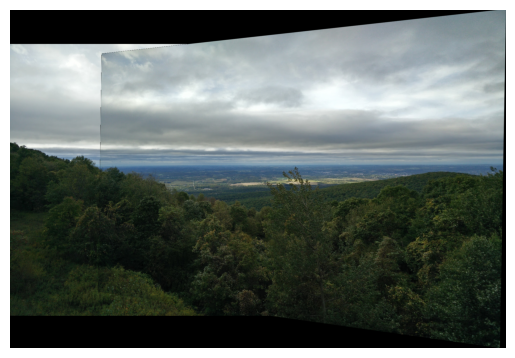

In [20]:
left_im_path = os.path.join(DATA_DIR, 'pano_left.jpg')
left_im = skimage.io.imread(left_im_path)
right_im_path = os.path.join(DATA_DIR, 'pano_right.jpg')
right_im = skimage.io.imread(right_im_path)
print(left_im.shape)

# Feel free to adjust as needed
ratio = 0.7
sigma = 0.15
max_iters = 600
inlier_tol = 1.0

panorama_im = createPanorama(left_im, right_im, ratio, sigma, max_iters, inlier_tol)

plt.imshow(panorama_im)
plt.axis('off')
plt.show()

(2048, 1536, 3) (2048, 1536, 3)


/tmp/ipython-input-916010380.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 if img[int(center[0]+row1)][int(center[1]+col1)] < img[int(center[0]+row2)][int(center[1]+col2)] else 0


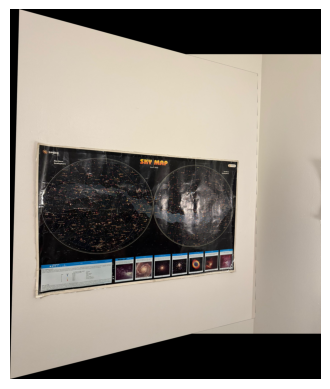

In [25]:
left_im_path = 'space_map1.jpeg'
left_im = skimage.io.imread(left_im_path)
right_im_path = 'space_map2.jpeg'
right_im = skimage.io.imread(right_im_path)
print(left_im.shape, right_im.shape)
ratio = 0.7
sigma = 0.15
max_iters = 600
inlier_tol = 1.0

panorama_im = createPanorama(left_im, right_im, ratio, sigma, max_iters, inlier_tol)

plt.imshow(panorama_im)
plt.axis('off')
plt.show()

## Q3.2 (Extra Credit - 5 Points) Panorama with Modern Feature Descripors

Classical descriptors like SIFT/ORB often fail under strong viewpoint or lighting changes. Modern learned methods overcome this by training on large datasets and often learning the matching step itself. Examples include:

- SuperGlue / LightGlue : context-aware graph/transformer matchers; LightGlue is faster and more practical for CPU.
- LoFTR : detector-free transformer matcher that outputs dense correspondences; very accurate but heavy.
- UniFlowMatch : unifies optical flow and matching in one network


Q3.2.1 (Extra Credit - 2 Points) Briefly describe three modern methods and their tradeoffs.

---

Modern deep learning based descriptors and matchers are trained on large datasets to improve robustness under strong viewpoint and lighting changes while learning both feature extraction and matching together.  
Here are three modern deep learning-based feature matching methods:

SuperGlue

Key Ideas: SuperGlue uses a Graph Neural Network (GNN) with attention mechanisms to perform context aggregation between keypoints, learning the matching assignment as an optimal transport problem. It processes both self-attention (within each image) and cross-attention (between images) to reason about correspondences.  

Strengths: It handles partial visibility and repetitive structures well due to context awareness and produces probabilistic matching scores with explicit handling of unmatched keypoints.  

Limitations: It has relatively slow inference and requires pre-extracted keypoints from SuperPoint or similar detectors, making it a two-stage process.  

LightGlue  

Key Ideas: It is a successor to SuperGlue that introduces adaptive computation with early stopping mechanisms to skip processing easy matches while focusing compute on difficult regions. It employs a more efficient transformer architecture with flash attention.  

Strengths: It is faster than SuperGlue while maintaining similar accuracy and can scale better to high-resolution images. It still maintains the context-aware matching benefits.  

Limitations: The performance gains are most significant on easy pairs with substantial overlap yet still require separate feature detection. It may underperform SuperGlue on extremely challenging cases with minimal overlap.  

LoFTR (Local Feature Transformer)  

Key Ideas: It is a detector-free approach that operates directly on dense feature maps from CNNs, giving coarse-level matches on low-resolution features and then refining them to pixel-level accuracy. It uses transformer layers for both self- and cross-attention at the coarse level.

Strengths: It works on poorly textured regions where keypoint detectors fail. It also provides dense correspondences that are end-to-end trainable without requiring keypoint supervision.  

Limitations: It is memory-intensive due to dense correlation operations and slower than sparse methods on high-resolution images. It may also produce more outliers in texture-rich regions compared to sparse keypoint-based methods.  

---


Q3.2.2 (Extra Credit - 3 Points) Run one modern descriptor.

- Pick one method (e.g., install [LightGlue](https://github.com/cvg/LightGlue), or [LoFTR](https://github.com/zju3dv/LoFTR)).
- Use it to extract and match features between two panorama images.
- Estimate a homography with RANSAC and stitch the images.
- You may use the helper code below for keypoint extraction and matching, or edit it for your needs.

> NOTE: Colab has limited GPU resources. Please run extraction/matching on CPU and downscale images (≤640 px) to keep runtime reasonable.

In [ ]:
!pip install git+https://github.com/cvg/LightGlue.git

!pip install kornia opencv-python matplotlib torch torchvision

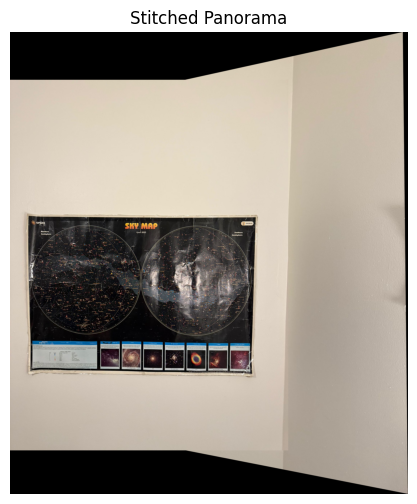

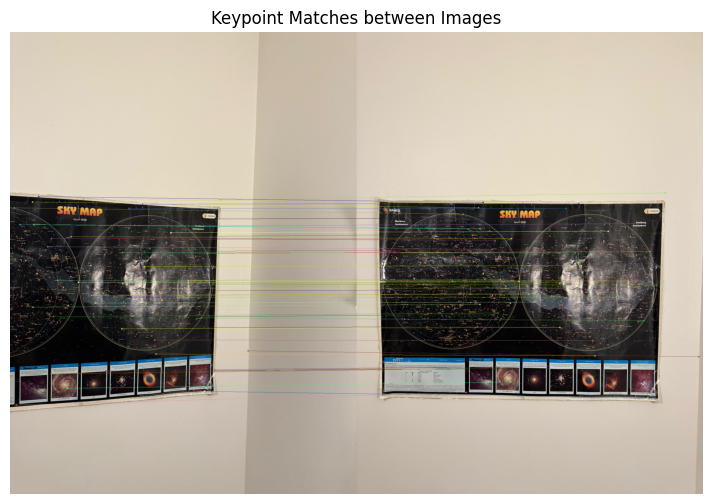

In [23]:
import cv2
import numpy as np
import torch
from matplotlib import pyplot as plt
from lightglue import LightGlue, SuperPoint
from lightglue.utils import load_image, rbd

def to_tensor(img: np.ndarray) -> torch.Tensor:
    """Convert HxWxC BGR image → torch tensor (1,3,H,W) float [0,1], CPU."""
    if img.ndim == 2:
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    else:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return torch.from_numpy(img).permute(2, 0, 1).float()[None] / 255.0

def draw_matches(img1, img2, mkpts0, mkpts1, max_draw=50):
    """Visualize matches between two images side by side."""
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    vis = np.zeros((max(h1, h2), w1 + w2, 3), dtype=np.uint8)
    vis[:h1, :w1] = img1
    vis[:h2, w1:w1 + w2] = img2
    # draw up to max_draw random matches
    idxs = np.arange(len(mkpts0))
    if len(idxs) > max_draw:
        idxs = np.random.choice(idxs, max_draw, replace=False)
    for i in idxs:
        (x0, y0) = mkpts0[i].astype(int)
        (x1, y1) = mkpts1[i].astype(int)
        pt0 = (x0, y0)
        pt1 = (x1 + w1, y1)
        color = tuple(np.random.randint(0, 255, size=3).tolist())
        cv2.circle(vis, pt0, 3, color, -1)
        cv2.circle(vis, pt1, 3, color, -1)
        cv2.line(vis, pt0, pt1, color, 1)
    return vis

# Load images (adjust paths as needed)
# img1 = cv2.imread(os.path.join(DATA_DIR, 'pano_left.jpg'))
# img2 = cv2.imread(os.path.join(DATA_DIR, 'pano_right.jpg'))
# assert img1 is not None and img2 is not None, "Could not load images"


#### Fill in your code to compute matches using deep learning models ###
#Custom Images
img1 = cv2.imread("space_map1.jpeg")
img2 = cv2.imread("space_map2.jpeg")
assert img1 is not None and img2 is not None, "Could not load images"


#### Fill in your code to compute matches using deep learning models ###
def downscale_image(img, max_dim):
    h, w = img.shape[:2]
    if max(h, w) <= max_dim:
        return img, 1.0

    scale = max_dim / max(h, w)
    new_w = int(w * scale)
    new_h = int(h * scale)
    resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
    return resized, scale


img1_small, scale1 = downscale_image(img1, max_dim = 640)
img2_small, scale2 = downscale_image(img2, max_dim = 640)

# Import and Initialize models
device = 'cuda' if torch.cuda.is_available() else 'cpu'
extractor = SuperPoint(max_num_keypoints=2048).eval().to(device)
matcher = LightGlue(features='superpoint').eval().to(device)
img1_tensor = to_tensor(img1_small).to(device)
img2_tensor = to_tensor(img2_small).to(device)

# Extract keypoint arrays
with torch.no_grad():
    feats0 = extractor.extract(img1_tensor)
    feats1 = extractor.extract(img2_tensor)

    matches01 = matcher({'image0': feats0, 'image1': feats1})
    feats0, feats1, matches01 = [rbd(x) for x in [feats0, feats1, matches01]]

    matches = matches01['matches']

    matches0 = matches[:, 0]
    matches1 = matches[:, 1]

    kpts0 = feats0['keypoints']
    kpts1 = feats1['keypoints']

    mkpts0_small = kpts0[matches0].cpu().numpy()
    mkpts1_small = kpts1[matches1].cpu().numpy()

# Extract matches points (mkpts0, mkpts1)
mkpts0 = mkpts0_small / scale1
mkpts1 = mkpts1_small / scale2

### End of your code #####

if len(mkpts0) < 4:
    raise RuntimeError("Not enough matches to compute homography")

# Estimate homography
H, mask = cv2.findHomography(mkpts0, mkpts1, cv2.RANSAC, 5.0)
if H is None:
    raise RuntimeError("Homography estimation failed")

# Compute panorama canvas
h1, w1 = img1.shape[:2]
h2, w2 = img2.shape[:2]
corners1 = np.float32([[0,0], [0,h1], [w1,h1], [w1,0]]).reshape(-1,1,2)
warped1 = cv2.perspectiveTransform(corners1, H)
corners2 = np.float32([[0,0], [0,h2], [w2,h2], [w2,0]]).reshape(-1,1,2)
all_corners = np.concatenate((warped1, corners2), axis=0)
[xmin, ymin] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
[xmax, ymax] = np.int32(all_corners.max(axis=0).ravel() + 0.5)
translation = [-xmin, -ymin]
T = np.array([[1,0,translation[0]], [0,1,translation[1]], [0,0,1]])

# Warp and merge
panorama = cv2.warpPerspective(img1, T @ H, (xmax-xmin, ymax-ymin))
panorama[translation[1]:translation[1]+h2, translation[0]:translation[0]+w2] = img2

# Display panorama inline
panorama_rgb = cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12,6))
plt.imshow(panorama_rgb)
plt.axis('off')
plt.title("Stitched Panorama")
plt.show()

# (Optional) visualize matches
vis = draw_matches(img1, img2, mkpts0, mkpts1)
vis_rgb = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12,6))
plt.imshow(vis_rgb)
plt.axis('off')
plt.title("Keypoint Matches between Images")
plt.show()

END OF FILEE!!